<a href="https://colab.research.google.com/github/hugomilesi/coffee_bean_classification/blob/main/Xception_fine_tunning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# File Management

In [179]:
#hide
%%writefile kaggle.json
{"username":"your_username","key":"your_API_key"}

Overwriting kaggle.json


In [180]:
#hide
!pip install -q -U kaggle
!pip install --upgrade --force-reinstall --no-deps kaggle
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached kaggle-1.5.12-py3-none-any.whl
  Attempting uninstall: kaggle
    Found existing installation: kaggle 1.5.12
    Uninstalling kaggle-1.5.12:
      Successfully uninstalled kaggle-1.5.12
mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [181]:
#getting the dataset
!kaggle datasets download -d gpiosenka/coffee-bean-dataset-resized-224-x-224

coffee-bean-dataset-resized-224-x-224.zip: Skipping, found more recently modified local copy (use --force to force download)


In [182]:
import os
import pandas as pd
from shutil import move
import pathlib
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
import random
import itertools
import zipfile
from keras_preprocessing.image import ImageDataGenerator
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras.preprocessing import image

In [183]:
if not os.path.exists(os.path.join('/content', 'coffee_dataset')):
  os.mkdir(os.path.join('/content', 'coffee_dataset'))

with zipfile.ZipFile('/content/coffee-bean-dataset-resized-224-x-224.zip', 'r') as zip_ref:
  zip_ref.extractall('/content/coffee_dataset')
print('Done extracting')

Done extracting


In [184]:
coffee_catalog = pd.read_csv('/content/coffee_dataset/Coffee Bean.csv')
coffee_catalog

,class index,filepaths,labels,data set
0,0,train/Dark/dark (1).png,Dark,train
1,0,train/Dark/dark (10).png,Dark,train
2,0,train/Dark/dark (100).png,Dark,train
3,0,train/Dark/dark (101).png,Dark,train
4,0,train/Dark/dark (102).png,Dark,train
...,...,...,...,...
1595,3,test/Medium/medium (95).png,Medium,test
1596,3,test/Medium/medium (96).png,Medium,test
1597,3,test/Medium/medium (97).png,Medium,test
1598,3,test/Medium/medium (98).png,Medium,test


In [210]:
#coffee Dark Green Light Medium
dark_test = os.listdir('/content/coffee_dataset/test/Dark')
green_test = os.listdir('/content/coffee_dataset/test/Green')
light_test = os.listdir('/content/coffee_dataset/test/Light')
medium_test = os.listdir('/content/coffee_dataset/test/Medium')

print(f'Dark test coffee: {len(dark_test)} \nGreen test coffee: {len(green_test)} \nLight test coffee: {len(light_test)} \nMedium train coffee: {len(medium_test)}')

#training folder check
dark_train = os.listdir('/content/coffee_dataset/train/Dark')
green_train = os.listdir('/content/coffee_dataset/train/Green')
light_train = os.listdir('/content/coffee_dataset/train/Light')
medium_train = os.listdir('/content/coffee_dataset/train/Medium')

print(f'\nDark train coffee: {len(dark_train)} \nGreen train coffee: {len(green_train)} \nLight train coffee: {len(light_train)} \nMedium train coffee: {len(medium_train)}')

Dark test coffee: 100 
Green test coffee: 100 
Light test coffee: 100 
Medium train coffee: 100

Dark train coffee: 300 
Green train coffee: 300 
Light train coffee: 300 
Medium train coffee: 300


In [186]:
#creating a validation folder
if not os.path.exists(os.path.join('/content/coffee_dataset', 'validation')):
  os.mkdir(os.path.join('/content/coffee_dataset', 'validation'))
  os.mkdir(os.path.join('/content/coffee_dataset/validation', 'Dark'))#Dark
  os.mkdir(os.path.join('/content/coffee_dataset/validation', 'Green'))#Green
  os.mkdir(os.path.join('/content/coffee_dataset/validation', 'Light'))#Light
  os.mkdir(os.path.join('/content/coffee_dataset/validation', 'Medium'))#Medium

In [187]:
train_path = '/content/coffee_dataset/train'
val_dark = '/content/coffee_dataset/validation/Dark'
val_green = '/content/coffee_dataset/validation/Green'
val_light = '/content/coffee_dataset/validation/Light'
val_medium = '/content/coffee_dataset/validation/Medium'

#function to move files to validation folder
def moveFiles(walk_path, path_to, name, batch_file):
  counter = 0
  if len(os.listdir(path_to)) == 0: #recently added
    for root, subfolder, filename in os.walk(walk_path):
      for files in filename:
        if files.lower().startswith(name) and counter < batch_file:
          path_from = os.path.join(root ,files)
          move(path_from, path_to)
          counter += 1
    print(f'Done! moved {counter} from {path_from} to {path_to}')
  else:
    return 'Folder has already files in inside'
  

moveFiles(train_path, val_dark, 'dark', 30)
moveFiles(train_path, val_green, 'green', 30)
moveFiles(train_path, val_light, 'light', 30)
moveFiles(train_path, val_medium, 'medium', 30)


'Folder has already files in inside'

In [188]:
train_path = '/content/coffee_dataset/train'
test_path = '/content/coffee_dataset/test'
validation_path = '/content/coffee_dataset/validation'

# Image Preprocessing

In [189]:

size = (224, 224)
batch_size = 30

# for data augmentation
train_datagen = ImageDataGenerator(rescale = 1.0/255,
                                   rotation_range = 60,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True,
                                   fill_mode = 'nearest'
                                   )

train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size = (224, 224),
    batch_size = batch_size,
    color_mode = 'rgb',
    class_mode = 'categorical'
)

test_generator = train_datagen.flow_from_directory(
    test_path,
    target_size = (224, 224),
    batch_size = batch_size,
    color_mode = 'rgb',
    class_mode = 'categorical',
    shuffle = False
)

validation_generator = train_datagen.flow_from_directory(
    validation_path,
    target_size = (224,224),
    color_mode = 'rgb',
    batch_size = batch_size,
    class_mode = 'categorical',
    shuffle = False
)

Found 1200 images belonging to 4 classes.
Found 400 images belonging to 4 classes.
Found 120 images belonging to 4 classes.


In [190]:
def show_images(folder_path, samples = 5, figsize = (30, 5)):
  folder_names = os.listdir(folder_path)

  #folder iteration
  for folder_name in folder_names:
    images_path = f'{folder_path}/{folder_name}'

    #making subplots
    fig, ax = plt.subplots(1, samples, figsize = figsize)
    plt.suptitle("Coffee beans belong to " + folder_name, color = 'crimson', fontsize = 20)

    # Iterating through the folder and printing n number of samples
    for image_num in range(samples):
      # Selecting a random image from the images
      random_image_name = random.choice(os.listdir(images_path))

      # Returns the image matrix (Since the images are read as metrics consisting of pixel values)
      image_matrix = plt.imread(images_path + '/' + random_image_name)
            
      # imshow() is used to view an image using image matrix
      ax[image_num].imshow(image_matrix)
            
      # Giving title to each image in subplots
      ax[image_num].set_title(random_image_name)
    

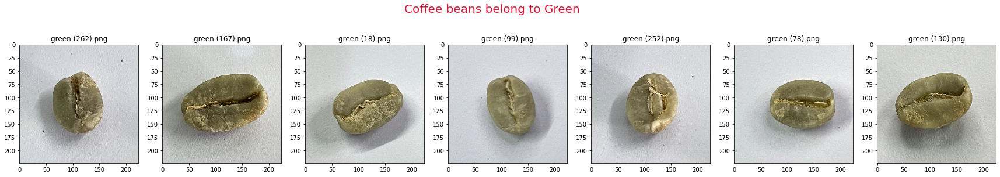

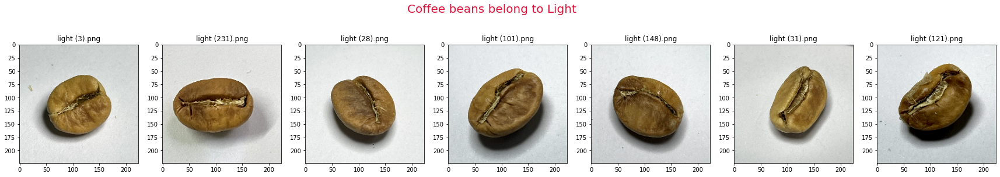

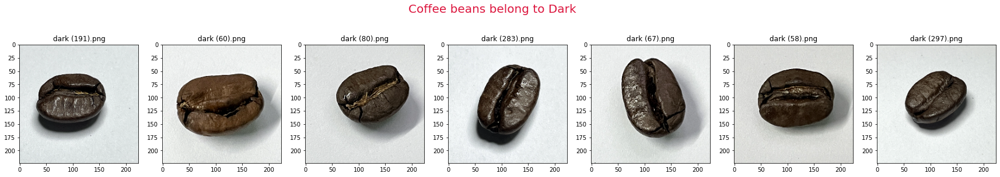

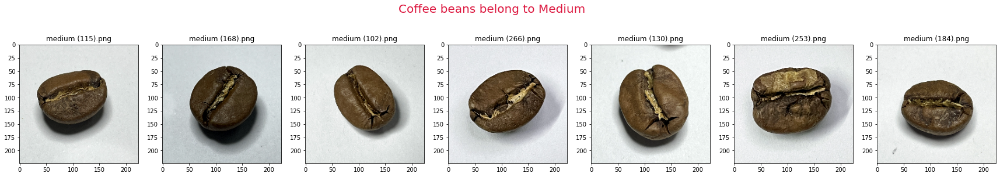

In [191]:
#samples from train folder
show_images(train_path, 7, figsize = (30,5))

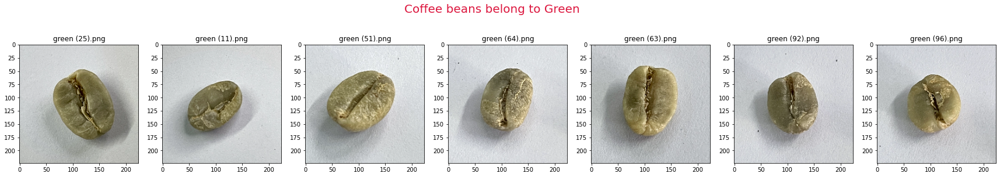

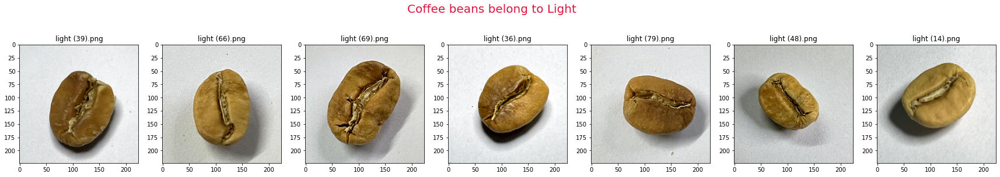

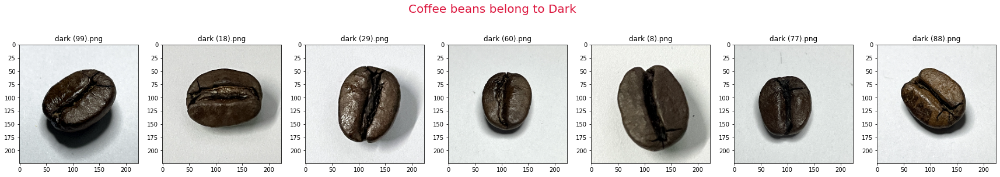

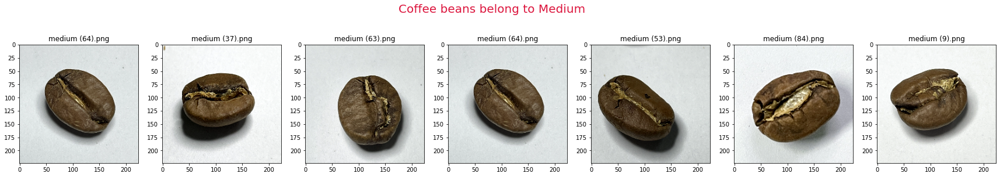

In [192]:
#samples from test folders
show_images(test_path, 7, figsize = (30,5))

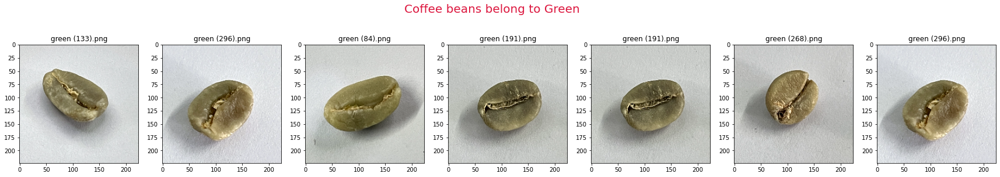

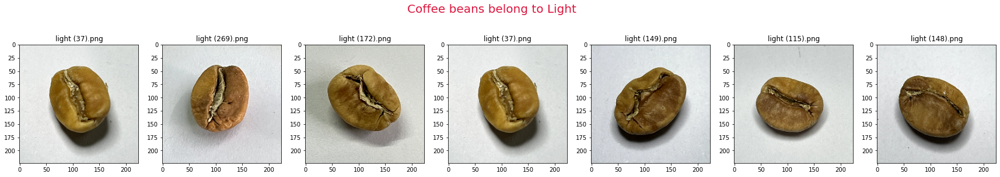

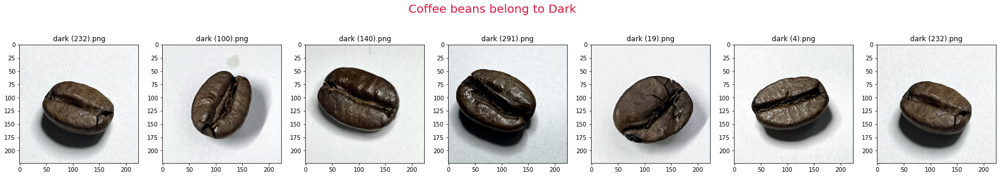

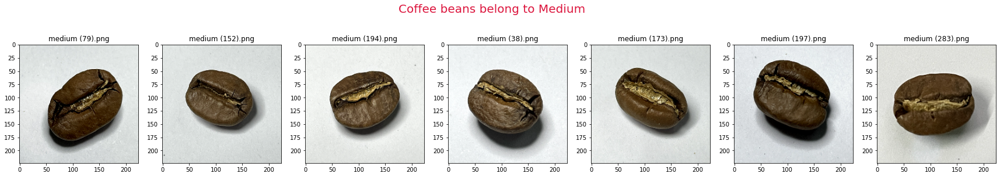

In [193]:
#samples from validation folders
show_images(validation_path, 7, figsize = (30,5))

In [194]:
def data_transformation_images(folder_path, image_gen_object, no_of_samples = 5, figsize = (35, 5)):
    
    # Folder names are stored here
    folder_names = os.listdir(folder_path)
    
    # Iterating through each folder
    for folder_name in folder_names:
        images_path = folder_path + '/' + folder_name
        
         # Making a subplot for each folder and pulling specified number of images. (Number of images you want to look and figsize can be defined by user as well)
        fig, ax = plt.subplots(1, no_of_samples, figsize = figsize)
        
        # Taking 1 random image from all images
        random_image_name = random.choice(os.listdir(folder_path + '/' + folder_name))
        random_image = plt.imread(folder_path + '/' + folder_name + '/' + random_image_name)
        
        plt.suptitle("Coffee beans belong to " + folder_name + '-> ' + 'Selected image: ' + random_image_name, color = 'crimson', fontsize = 20)
        # Applying n number of transformations to single randomly selected image and plotting them. 
        for image_num in range(no_of_samples):
            ax[image_num].imshow(train_datagen.random_transform(random_image))
            ax[image_num].set_title('Transformation Number: {}'.format(image_num + 1))

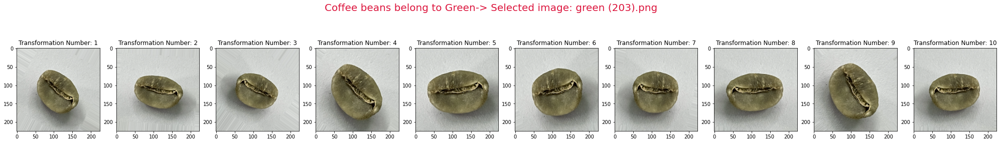

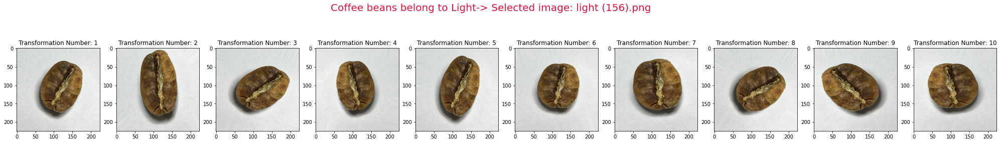

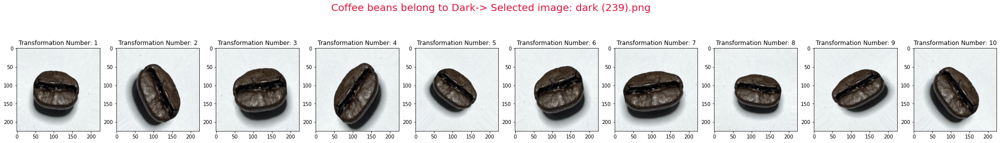

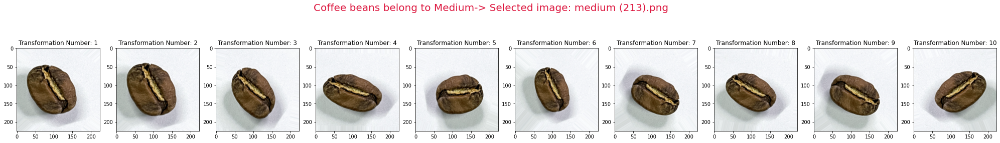

In [195]:
data_transformation_images(train_path, train_datagen, no_of_samples = 10)

#Transfer Learning With Xception


In [196]:
input_shape = (224, 224, 3)

base_model = tf.keras.applications.Xception(include_top = False)
base_model.trainable = False

#model structure
inputs = tf.keras.Input(shape = input_shape)
x = base_model(inputs, training = False)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
outputs = tf.keras.layers.Dense(4, activation = 'softmax')(x)


xception = tf.keras.Model(inputs, outputs)
xception.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 xception (Functional)       (None, None, None, 2048)  20861480  
                                                                 
 global_average_pooling2d_3   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_3 (Dense)             (None, 4)                 8196      
                                                                 
Total params: 20,869,676
Trainable params: 8,196
Non-trainable params: 20,861,480
_________________________________________________________________


In [197]:
xception.compile(
    optimizer = 'Adam',
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)


In [198]:

callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)
history = xception.fit(
    train_generator,
    epochs = 10,
    validation_data = validation_generator,
    validation_steps = validation_generator.samples // validation_generator.batch_size,
    steps_per_epoch = train_generator.samples // train_generator.batch_size,
    callbacks =[callback],
    verbose = 1

)

Epoch 1/10
40/40 [==============================] - 21s 459ms/step - loss: 0.8138 - accuracy: 0.7275 - val_loss: 0.4601 - val_accuracy: 0.8833
Epoch 2/10
40/40 [==============================] - 17s 428ms/step - loss: 0.3606 - accuracy: 0.8975 - val_loss: 0.2851 - val_accuracy: 0.9417
Epoch 3/10
40/40 [==============================] - 17s 433ms/step - loss: 0.2548 - accuracy: 0.9367 - val_loss: 0.2327 - val_accuracy: 0.9500
Epoch 4/10
40/40 [==============================] - 17s 431ms/step - loss: 0.2141 - accuracy: 0.9475 - val_loss: 0.2043 - val_accuracy: 0.9333
Epoch 5/10
40/40 [==============================] - 17s 429ms/step - loss: 0.1891 - accuracy: 0.9475 - val_loss: 0.1940 - val_accuracy: 0.9333
Epoch 6/10
40/40 [==============================] - 17s 434ms/step - loss: 0.1643 - accuracy: 0.9567 - val_loss: 0.1795 - val_accuracy: 0.9667
Epoch 7/10
40/40 [==============================] - 18s 447ms/step - loss: 0.1476 - accuracy: 0.9550 - val_loss: 0.1601 - val_accuracy: 0.9500

In [199]:
#evaluation
xception.evaluate(x = test_generator )

14/14 [==============================] - 5s 367ms/step - loss: 0.1190 - accuracy: 0.9725


[0.11898920685052872, 0.9725000262260437]

# Fine Tuning

In [200]:
#Set all trainable back to True
base_model.trainable = True

#making making the last 10 layers trainable
for layer in base_model.layers[:-10]:
  layer.trainable = False

#checking the trainable layers, uncomment to see
#for layer in base_model.layers:
  #print(layer.trainable)

#recompiling the model
xception.compile(loss = 'categorical_crossentropy', optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), metrics = ['accuracy'])

#for layer in xception.layers:
#  print(layer.name, layer.trainable)

In [201]:
#fine tune for more 15 epochs to reduce loss value

history_fine_tune = xception.fit(
    train_generator,
    epochs = 15,
    validation_data = validation_generator,
    validation_steps = validation_generator.samples // validation_generator.batch_size,
    steps_per_epoch = train_generator.samples // train_generator.batch_size,
    verbose = 1,
    callbacks = [callback]
                                 )

Epoch 1/15
40/40 [==============================] - 21s 461ms/step - loss: 0.1631 - accuracy: 0.9375 - val_loss: 0.0718 - val_accuracy: 0.9750
Epoch 2/15
40/40 [==============================] - 18s 437ms/step - loss: 0.0853 - accuracy: 0.9658 - val_loss: 0.0845 - val_accuracy: 0.9667
Epoch 3/15
40/40 [==============================] - 18s 452ms/step - loss: 0.0612 - accuracy: 0.9800 - val_loss: 0.0751 - val_accuracy: 0.9667
Epoch 4/15
40/40 [==============================] - 17s 434ms/step - loss: 0.0480 - accuracy: 0.9792 - val_loss: 0.0515 - val_accuracy: 0.9833
Epoch 5/15
40/40 [==============================] - 18s 436ms/step - loss: 0.0610 - accuracy: 0.9767 - val_loss: 0.1119 - val_accuracy: 0.9583
Epoch 6/15
40/40 [==============================] - 18s 441ms/step - loss: 0.0684 - accuracy: 0.9717 - val_loss: 0.0586 - val_accuracy: 0.9917
Epoch 7/15
40/40 [==============================] - 17s 433ms/step - loss: 0.0342 - accuracy: 0.9867 - val_loss: 0.0200 - val_accuracy: 1.0000

# Model Evaluation

## Confusion Matrix

In [202]:
#Confusion Matrix Function


def get_CM(cm, classes, normalize = False, title = 'Confusion Matrix', cmap = plt.cm.Blues):
  plt.figure(figsize=(12,8))
  plt.imshow(cm, interpolation='nearest', cmap=cmap)
  plt.title(title)
  plt.colorbar()
  tick_marks = np.arange(len(classes))
  plt.xticks(tick_marks, classes, rotation=45)
  plt.yticks(tick_marks, classes)

  if normalize:
      cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
      print("Normalized confusion matrix")
  else:
      print('Confusion matrix, without normalization')

  print(cm)

  thresh = cm.max() / 2.
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
      plt.text(j, i, cm[i, j],
          horizontalalignment="center",
          color="white" if cm[i, j] > thresh else "black")

  plt.tight_layout()
  plt.ylabel('True label')
  plt.xlabel('Predicted label')



Confusion matrix, without normalization
[[ 99   0   0   1]
 [  0 100   0   0]
 [  0   1  98   1]
 [  3   0   0  97]]


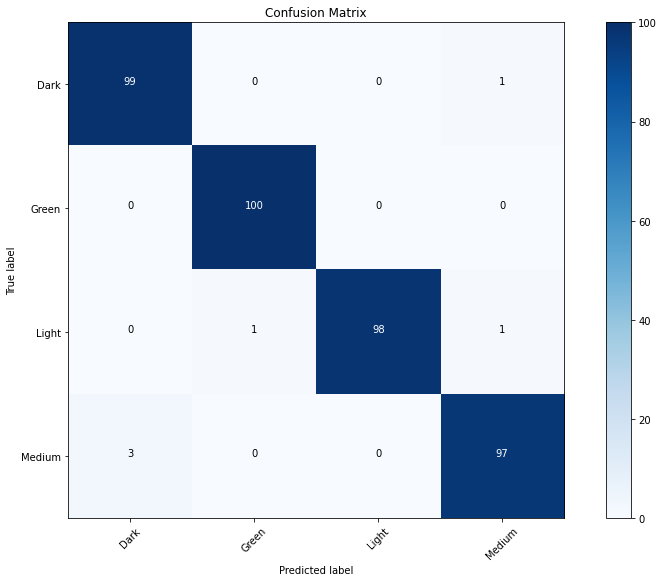

In [203]:

predictions = xception.predict(x = test_generator, steps = len(test_generator), verbose = 0)  

cm = confusion_matrix(y_true = test_generator.classes, y_pred = predictions.argmax(axis = 1))

cm_plot_labels = ['Dark','Green','Light','Medium']
get_CM(cm = cm, classes = cm_plot_labels, title = 'Confusion Matrix')

In [204]:
train_generator.batch_size
train_generator.samples
train_generator.class_indices

{'Dark': 0, 'Green': 1, 'Light': 2, 'Medium': 3}

## Loss Chart

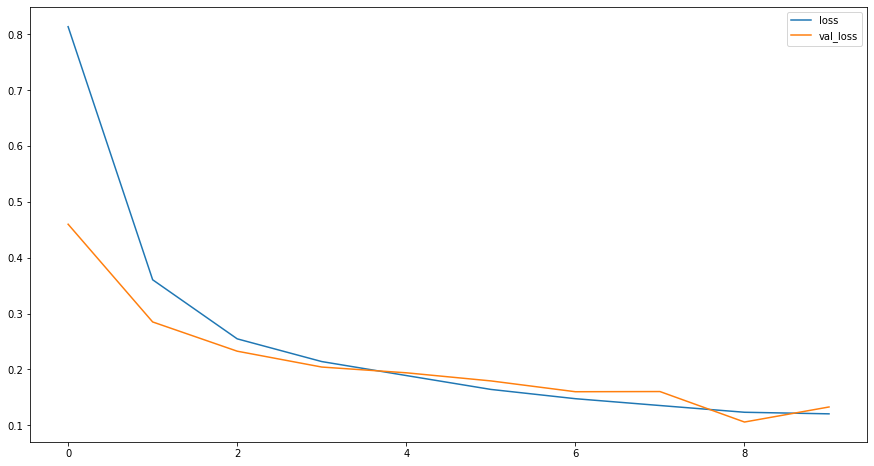

In [205]:
losses = pd.DataFrame(history.history)
losses[['loss', 'val_loss']].plot(figsize = (15,8))
plt.show()


## Accuracy Chart

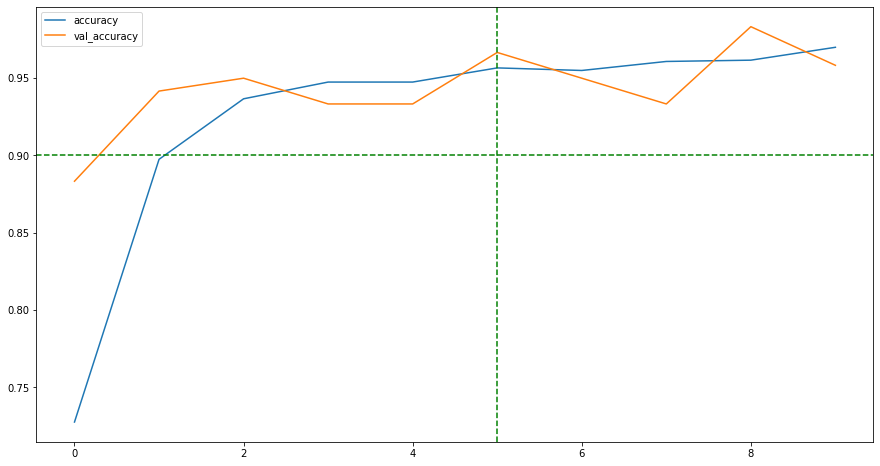

In [206]:
losses[['accuracy', 'val_accuracy']].plot(figsize = (15, 8))
plt.axhline(0.90, color = 'green', linestyle = '--')
plt.axvline(5, color = 'green', linestyle = '--')
plt.show()

## Scoring New Data

In [207]:
data_dir = pathlib.Path(validation_path)
class_names = np.array(sorted([item.name for item in data_dir.glob("*")])) # creating a list of class names from subdirectory 
print(f'Classes are: {class_names}')


#image vectorizing function
def load_and_prep_image(filename, img_shape = 224):
  img = tf.io.read_file(filename) #read image
  img = tf.image.decode_image(img) # decode the image to a tensor
  img = tf.image.resize(img, size = [img_shape, img_shape]) # resize the image
  img = img/255. # rescale the image
  return img

Classes are: ['Dark' 'Green' 'Light' 'Medium']


In [220]:
def pred_and_plot(model, filename, class_names):
  
  # using the function above
  img = load_and_prep_image(filename) 
  # Make a prediction
  pred = model.predict(tf.expand_dims(img, axis=0))

  # Get the predicted class
  if len(pred[0]) > 1: # check for multi-class
    pred_class = class_names[pred.argmax()] # if more than one output, take the max
  else:
    pred_class = class_names[int(tf.round(pred)[0][0])] # if only one output, round

  # Plot the image and predicted class
  plt.figure(figsize=(12,8))
  plt.imshow(img)
  plt.title(f"ORIGINAL FILE: {filename.split('/')[-1]}\n\nMODEL PREDICTION: {pred_class}", color = 'orange', fontsize = 20)
  plt.axis(False);

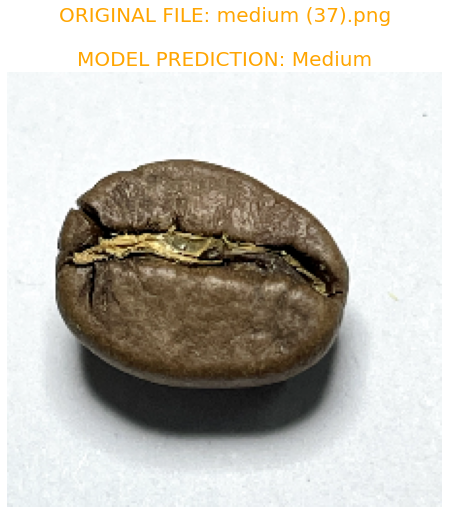

In [224]:
#selecting a random bean folder inside validation
random_folder = random.choice(os.listdir(validation_path))
#selecting a random bean filename
random_image = random.choice(os.listdir(validation_path + '/' + random_folder + '/'))

#merge random folder and file together for full file path
test_image = validation_path + '/' + random_folder + '/' + random_image

#print(f"Original File Path: {test_image}")
pred_and_plot(xception, test_image, class_names)
